In [ ]:
! pip install kaggle
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
! kaggle competitions download uw-madison-gi-tract-image-segmentation

100% 2.29G/2.30G [00:17<00:00, 197MB/s]
100% 2.30G/2.30G [00:17<00:00, 138MB/s]


In [ ]:
! unzip /content/uw-madison-gi-tract-image-segmentation.zip

In [ ]:
! pip install monai

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 939 kB 7.9 MB/s 


In [ ]:
import numpy as np
import pandas as pd
import torch.nn as nn
import torchvision.transforms as transforms
import torchvision.models as tv_models
import matplotlib.pyplot as plt
import seaborn as sns
import cv2, torch, tqdm, os, torchvision, gc, warnings, random
from torchvision.models.resnet import ResNet, BasicBlock, Bottleneck
from torch.utils.data import Dataset, DataLoader
from monai.metrics import compute_hausdorff_distance

os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
torch.autograd.set_detect_anomaly(True)

In [ ]:
data_df_path = '/content/train.csv'
data_df = pd.read_csv(data_df_path)
data_df.head()

,id,class,segmentation
0,case123_day20_slice_0001,large_bowel,NaN
1,case123_day20_slice_0001,small_bowel,NaN
2,case123_day20_slice_0001,stomach,NaN
3,case123_day20_slice_0002,large_bowel,NaN
4,case123_day20_slice_0002,small_bowel,NaN


In [ ]:
data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115488 entries, 0 to 115487
Data columns (total 3 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   id            115488 non-null  object
 1   class         115488 non-null  object
 2   segmentation  33913 non-null   object
dtypes: object(3)
memory usage: 2.6+ MB


In [ ]:
def long_to_wide(df):
    df = df.pivot(index='id', columns='class', values='segmentation')
    df['id'] = df.index
    df.index = [i for i in range(len(df))]
    return df

data_df = long_to_wide(data_df)
data_df.head()

class,large_bowel,small_bowel,stomach,id
0,NaN,NaN,NaN,case101_day20_slice_0001
1,NaN,NaN,NaN,case101_day20_slice_0002
2,NaN,NaN,NaN,case101_day20_slice_0003
3,NaN,NaN,NaN,case101_day20_slice_0004
4,NaN,NaN,NaN,case101_day20_slice_0005


In [ ]:
def get_info_from_path(path):
    case_day, filname = path.rsplit("/", maxsplit=3)[1::2]
    case, day = case_day.split('_')
    case_slice = filname.split('_')[0:2]
    case_slice = '_'.join(case_slice)
    img_id = '_'.join([case_day, case_slice])

    case = case.replace('case', '')
    day = day.replace('day', '')
    slice_no, width, height = filname.split('_')[1:4]
    
    return img_id, case, day, slice_no, width, height


def get_file_names(root_path: str, ext='.png'):
    image_paths = []
    image_properties = []
    for path, subdirs, files in tqdm.tqdm(os.walk(root_path)):
        for name in files:
            img_path = os.path.join(path, name)
            image_paths.append(img_path)
            properties = list(get_info_from_path(img_path))
            image_properties.append(properties)
                        
    return image_paths, image_properties

training_data_path = '/content/train'
image_paths, image_properties = get_file_names(training_data_path)

634it [00:00, 2575.56it/s]


In [ ]:
image_properties = np.array(image_properties)

img_df = pd.DataFrame()

img_df['id'] = image_properties[:, 0]
img_df['case'] = image_properties[:, 1].astype(int)
img_df['day'] = image_properties[:, 2].astype(int)
img_df['slice'] = image_properties[:, 3].astype(int)
img_df['width'] = image_properties[:, 4].astype(int)
img_df['height'] = image_properties[:, 5].astype(int)
img_df['path'] = image_paths

img_df.head()

,id,case,day,slice,width,height,path
0,case146_day0_slice_0010,146,0,10,266,266,/content/train/case146/case146_day0/scans/slic...
1,case146_day0_slice_0068,146,0,68,266,266,/content/train/case146/case146_day0/scans/slic...
2,case146_day0_slice_0062,146,0,62,266,266,/content/train/case146/case146_day0/scans/slic...
3,case146_day0_slice_0109,146,0,109,266,266,/content/train/case146/case146_day0/scans/slic...
4,case146_day0_slice_0009,146,0,9,266,266,/content/train/case146/case146_day0/scans/slic...


In [ ]:
data_df = data_df.merge(img_df, on='id', how='outer')
id_column = data_df.pop('id')
data_df.insert(0, 'id', id_column)

data_df.head()

,id,large_bowel,small_bowel,stomach,case,day,slice,width,height,path
0,case101_day20_slice_0001,NaN,NaN,NaN,101,20,1,266,266,/content/train/case101/case101_day20/scans/sli...
1,case101_day20_slice_0002,NaN,NaN,NaN,101,20,2,266,266,/content/train/case101/case101_day20/scans/sli...
2,case101_day20_slice_0003,NaN,NaN,NaN,101,20,3,266,266,/content/train/case101/case101_day20/scans/sli...
3,case101_day20_slice_0004,NaN,NaN,NaN,101,20,4,266,266,/content/train/case101/case101_day20/scans/sli...
4,case101_day20_slice_0005,NaN,NaN,NaN,101,20,5,266,266,/content/train/case101/case101_day20/scans/sli...


In [ ]:
lb_seg = data_df.large_bowel[94]
sb_seg = data_df.small_bowel[94]
stomach_seg = data_df.stomach[94]

print(
    f'tumor on large bowel mask\n: {lb_seg} \n\n', 
    f'tumor on small bowel mask\n: {sb_seg} \n\n',
    f'tumor on stomach mask\n: {stomach_seg} \n\n')

tumor on large bowel mask
: 24153 7 24417 11 24682 14 24948 14 25213 16 25479 17 25744 19 26009 21 26275 21 26540 23 26805 24 27071 24 27337 24 27603 24 27869 23 28135 23 28401 23 28667 22 28934 20 29052 6 29201 17 29317 9 29468 13 29582 11 29735 9 29848 11 30002 6 30114 12 30380 12 30544 14 30646 13 30809 16 30912 13 31074 18 31178 14 31339 19 31444 14 31605 19 31710 14 31871 20 31976 14 32137 20 32242 15 32403 19 32507 16 32669 19 32773 16 32935 19 33039 16 33201 19 33304 17 33467 19 33570 17 33734 18 33836 17 34001 17 34101 18 34268 15 34367 19 34536 13 34633 19 34803 11 34898 20 35071 9 35163 21 35338 7 35429 21 35694 22 35960 22 36225 22 36491 22 36755 24 37020 25 37286 24 37551 24 37816 25 38082 24 38347 24 38613 23 38879 23 39145 22 39411 22 39677 21 39943 21 40209 20 40476 18 40742 18 41008 17 41275 15 41541 15 41808 13 42075 11 42343 7 

 tumor on small bowel mask
: 26184 4 26449 7 26715 8 26980 11 27245 14 27510 19 27775 21 28041 21 28306 21 28571 21 28837 19 29103 18 29368 1

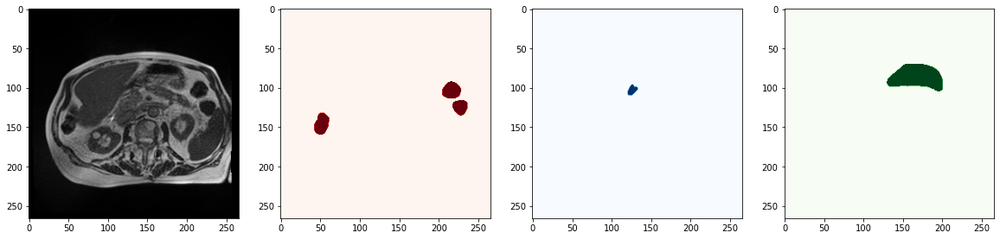

In [ ]:
def rle2mask(img_shape, rle):
    #correct order: (H, W)
    H, W = img_shape
    
    rle = rle.split()
    start_idx, lengths = np.array(rle[0::2], dtype=int), np.array(rle[1::2], dtype=int)
    end_idx = start_idx + (lengths - 1)
    
    mask = np.zeros(H*W, dtype=np.int8)

    for start, end in zip(start_idx, end_idx):
        mask[start:end] = 1

    mask = mask.reshape(H, W)
    return mask


idx = 90
sample_path = data_df.path[idx]
lb_seg = data_df.large_bowel[idx]
sb_seg = data_df.small_bowel[idx]
stomach_seg = data_df.stomach[idx]

sample_img = cv2.imread(sample_path, cv2.IMREAD_UNCHANGED)
img_shape = sample_img.shape

lb_seg_mask = rle2mask(img_shape, lb_seg)
sb_seg_mask = rle2mask(img_shape, sb_seg)
stomach_seg_mask = rle2mask(img_shape, stomach_seg)



fig, axs = plt.subplots(1, 4, figsize=(20, 8))

axs[0].imshow(sample_img, cmap='gray')
axs[1].imshow(lb_seg_mask, cmap='Reds')
axs[2].imshow(sb_seg_mask, cmap='Blues')
axs[3].imshow(stomach_seg_mask, cmap='Greens')

In [ ]:
data_df = data_df.sample(frac=1)
data_df.index = [i for i in range(len(data_df))]
data_df.head()

,id,large_bowel,small_bowel,stomach,case,day,slice,width,height,path
0,case49_day0_slice_0017,NaN,NaN,NaN,49,0,17,360,310,/content/train/case49/case49_day0/scans/slice_...
1,case18_day17_slice_0048,NaN,NaN,NaN,18,17,48,360,310,/content/train/case18/case18_day17/scans/slice...
2,case24_day0_slice_0009,NaN,NaN,NaN,24,0,9,266,266,/content/train/case24/case24_day0/scans/slice_...
3,case74_day13_slice_0034,NaN,NaN,NaN,74,13,34,266,266,/content/train/case74/case74_day13/scans/slice...
4,case63_day22_slice_0097,26403 11 26447 4 26666 15 26711 12 26729 8 269...,26751 10 27015 16 27281 19 27546 22 27812 24 2...,NaN,63,22,97,266,266,/content/train/case63/case63_day22/scans/slice...


In [ ]:
def check_empty(df):
  df['is_empty'] = False
  if pd.isna(df.large_bowel) and pd.isna(df.large_bowel) and pd.isna(df.stomach):
    df['is_empty'] = True
  return df

data_df = data_df.apply(check_empty, axis=1)
data_df.head()

,id,large_bowel,small_bowel,stomach,case,day,slice,width,height,path,is_empty
0,case49_day0_slice_0017,NaN,NaN,NaN,49,0,17,360,310,/content/train/case49/case49_day0/scans/slice_...,True
1,case18_day17_slice_0048,NaN,NaN,NaN,18,17,48,360,310,/content/train/case18/case18_day17/scans/slice...,True
2,case24_day0_slice_0009,NaN,NaN,NaN,24,0,9,266,266,/content/train/case24/case24_day0/scans/slice_...,True
3,case74_day13_slice_0034,NaN,NaN,NaN,74,13,34,266,266,/content/train/case74/case74_day13/scans/slice...,True
4,case63_day22_slice_0097,26403 11 26447 4 26666 15 26711 12 26729 8 269...,26751 10 27015 16 27281 19 27546 22 27812 24 2...,NaN,63,22,97,266,266,/content/train/case63/case63_day22/scans/slice...,False


In [ ]:
#remove bad data
to_drop = data_df[(data_df['case'] == 7) & (data_df['day'] == 0)].index
data_df.drop(to_drop, inplace=True)

to_drop = data_df[(data_df['case'] == 81) & (data_df['day'] == 30)].index
data_df.drop(to_drop, inplace=True)

print(len(data_df))

data_df.index = [i for i in range(len(data_df))]
data_df.head()

38208


,id,large_bowel,small_bowel,stomach,case,day,slice,width,height,path,is_empty
0,case49_day0_slice_0017,NaN,NaN,NaN,49,0,17,360,310,/content/train/case49/case49_day0/scans/slice_...,True
1,case18_day17_slice_0048,NaN,NaN,NaN,18,17,48,360,310,/content/train/case18/case18_day17/scans/slice...,True
2,case24_day0_slice_0009,NaN,NaN,NaN,24,0,9,266,266,/content/train/case24/case24_day0/scans/slice_...,True
3,case74_day13_slice_0034,NaN,NaN,NaN,74,13,34,266,266,/content/train/case74/case74_day13/scans/slice...,True
4,case63_day22_slice_0097,26403 11 26447 4 26666 15 26711 12 26729 8 269...,26751 10 27015 16 27281 19 27546 22 27812 24 2...,NaN,63,22,97,266,266,/content/train/case63/case63_day22/scans/slice...,False


Text(0.5, 1.0, 'count plot of number of samples with empty mask')

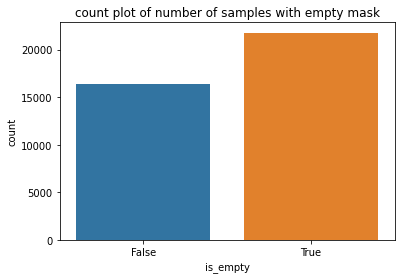

In [ ]:
sns.countplot(x ='is_empty', data = data_df)
plt.title('count plot of number of samples with empty mask')

In [ ]:
def get_images(paths):
    images = []
    for img_path in tqdm.tqdm(paths):
        sample_img = cv2.imread(img_path, cv2.IMREAD_UNCHANGED)
        images.append(sample_img)
        
    return images
        
loaded_images = get_images(data_df.path)

100%|██████████| 38208/38208 [01:12<00:00, 528.04it/s]


In [ ]:
len(loaded_images)

38208

In [ ]:
class FirstChannelRandomGaussianBlur(object):
    def __init__(self, p, kernel_size=(5, 9), sigma=(0.1, 11)):
        self.p = p
        self.kernel_size = kernel_size
        self.sigma = sigma
        self.gaussian_blur = transforms.GaussianBlur(kernel_size=self.kernel_size, sigma=self.sigma)

    def __call__(self, sample):
        #input shape: (4, H, W)
        image, mask = sample[0].unsqueeze(dim=0), sample[1:]
        randn = np.random.rand()
        if randn < self.p: image = self.gaussian_blur(image)
        sample = torch.cat((image, mask), dim=0)
        return sample


class CustomRandomRotation(object):
    def __init__(self, p, angle_range=(0, 360)):
        self.p = p
        self.angle_range = angle_range
        self.random_rotation = transforms.RandomRotation(self.angle_range)

    def __call__(self, sample):
        #input shape: (C, H, W)
        randn = np.random.rand()
        if randn < self.p:
            sample = self.random_rotation(sample)
            sample[1:, ...] = sample[1:, ...].round()
        return sample

  
class CustomRandomResizedCrop(object):
    def __init__(self, p, scale=(0.3, 1.0)):
        self.p = p
        self.scale = scale

    def __call__(self, sample):
        #input shape: (C, H, W)
        _, H, W = sample.shape
        randn = np.random.rand()
        random_resizedcrop = transforms.RandomResizedCrop(
            (H, W), scale=self.scale, interpolation=transforms.InterpolationMode.NEAREST)
        
        if randn < self.p: 
            sample = random_resizedcrop(sample)
            sample[1:, ...] = sample[1:, ...].round()
        return sample
        

def image_resize(image, size=(224, 224)):
    #image shape: C, H, W or N, C, H, W
    H, W = size
    assert len(image.shape) == 3 or len(image.shape) == 4, \
     'input image must be of shape  C, H, W or N, C, H, W'

    if isinstance(image, np.ndarray): image = torch.from_numpy(image) 
    res_model = transforms.Resize((H, W), interpolation=transforms.InterpolationMode.NEAREST)
    image = res_model(image)
    return image


def image_normalize(image):
    #image size: (C, H, W)
    image = image.max() - image
    image = image - image.min()
    image = image / image.max()
    return image


def image_normalize_with_noise(image, alpha=torch.Tensor([1, 0.8])):

    if isinstance(alpha, int) or isinstance(alpha, float):
        alpha = torch.Tensor([alpha for i in range(2)])

    elif torch.is_tensor(alpha):
        alpha = alpha

    else:
        raise ValueError(f'invalid alpha type, {type(alpha)}')

    weights = torch._sample_dirichlet(alpha)
    w2 = weights.min()
    weights = weights[weights!=w2]
    w1 = weights
        
    minmax_norm = image_normalize(image)
    noise = torch.normal(mean=0, std=1, size=image.shape)
    noise = image_normalize(noise)

    mix = (w1*minmax_norm) + (w2*noise)
    return mix
        


def data_augmentation(**kwargs):

    defaultKwargs = {
        'shuffle_tranforms':True,
        'crop_p':0.5, 
        'rotation_p':0.5, 
        'Hflip_p':0.5, 
        'Vflip_p':0.5, 
        'blur_p':0.5, 
        'rotation_angle_range':(-60, 60),
        'crop_scale':(0.1, 1.0),
        'blur_kernel_size':(5, 9),
        'blur_sigma':(0.1, 11),
        }

    kwargs = {**defaultKwargs, **kwargs}

    transform_list = [
        CustomRandomResizedCrop(p=kwargs['crop_p'], scale=kwargs['crop_scale']),
        CustomRandomRotation(p=kwargs['rotation_p'], angle_range=kwargs['rotation_angle_range']),
        transforms.RandomHorizontalFlip(kwargs['Hflip_p']),
        transforms.RandomVerticalFlip(kwargs['Vflip_p']),
        FirstChannelRandomGaussianBlur(kwargs['blur_p'], kernel_size=kwargs['blur_kernel_size'], sigma=kwargs['blur_sigma']),
    ]
    if kwargs['shuffle_tranforms']: random.shuffle(transform_list)
    T = transforms.Compose(transform_list)
    return T


data_transforms = data_augmentation()

In [ ]:
class ImageDataset(Dataset):
    def __init__(self, images, images_df, transform=None, tp=0.5):
        self.images = images
        self.images_df = images_df
        self.transform = transform
        self.tp = tp
        
        
    def __len__(self):
        return len(self.images_df)
    
       
    def __getitem__(self, idx:int):
        image = self.images[idx]
        image = np.expand_dims(image, axis=0).astype('float32')

        original_H, original_W = image.shape[1:]
        
        lb_seg_mask = self.rle2mask(image.shape[1:], self.images_df.large_bowel[idx])
        sb_seg_mask = self.rle2mask(image.shape[1:], self.images_df.small_bowel[idx])
        stomach_seg_mask = self.rle2mask(image.shape[1:], self.images_df.stomach[idx])
        
        gt_mask = np.stack((lb_seg_mask, sb_seg_mask, stomach_seg_mask), axis=0).astype('float32')

        normalised = False
        if self.transform:
            randn = np.random.rand()
            if randn < self.tp:
                aug = self.transform(
                    torch.from_numpy(
                        np.concatenate((image, gt_mask), axis=0)
                    ))
                image, gt_mask = aug[0].unsqueeze(dim=0), aug[1:]
                image = image_normalize_with_noise(image)
                normalised = True

        image = image_resize(image) #shape: (1, H, W)
        gt_mask = image_resize(gt_mask) #shape: (3, H, W)

        if not normalised:
            image = image_normalize(image)
            normalised = True

        return image, gt_mask
    

    def rle2mask(self, img_shape, rle:str):
        #correct order: (H, W)
        H, W = img_shape
        if pd.isnull(rle): return np.zeros((H, W), dtype=np.int8)
        
        rle = rle.split()
        start_idx, lengths = np.array(rle[0::2], dtype=int), np.array(rle[1::2], dtype=int)
        end_idx = start_idx + (lengths - 1)

        mask = np.zeros(H*W, dtype=np.int8)
        for start, end in zip(start_idx, end_idx):
            mask[start:end] = 1

        mask = mask.reshape(H, W)
        return mask

torch.Size([1, 224, 224]) torch.Size([3, 224, 224])
tensor(0.9880) tensor(0.0726)


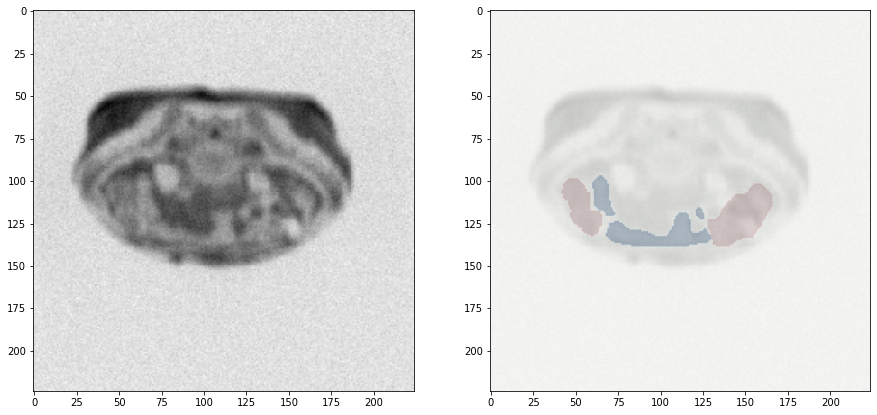

In [ ]:
data = ImageDataset(loaded_images, data_df, transform=data_transforms, tp=0.8)

image, gt_mask = data[11]

print(image.shape, gt_mask.shape)

fig, axs = plt.subplots(1, 2, figsize=(15, 7))

alpha = 0.4

image = image_resize(image, size=(gt_mask.shape[1:]))

axs[0].imshow(image.squeeze(), cmap='gray')

axs[1].imshow(image.squeeze(), cmap='gray')
axs[1].imshow(gt_mask[0], cmap='Reds', alpha=alpha)
axs[1].imshow(gt_mask[1], cmap='Blues', alpha=alpha)
axs[1].imshow(gt_mask[2], cmap='Greens', alpha=alpha)

print(image.max(), image.min())

In [ ]:
torch.manual_seed(3407)
torch.cuda.manual_seed(3407)
np.random.seed(3407)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [ ]:
class SpatialEncoder(ResNet):
    def __init__(self, input_channels, dropout=0.2, 
                 pretrained=False, block=BasicBlock, block_layers=[3, 4, 6, 3]):
      
        self.block = block
        self.block_layers = block_layers
        
        super(SpatialEncoder, self).__init__(self.block, self.block_layers)
        
        self.input_channels = input_channels
        self.dropout = dropout
        self.pretrained = pretrained
        
        self.conv1 = nn.Conv2d(
            self.input_channels, 64, 
            kernel_size=(7, 7), 
            stride=(2, 2), 
            padding=(3, 3), 
            bias=False)
        
        self.conv2 = nn.Conv2d(
            64, 64, 
            kernel_size=(7, 7), 
            stride=(2, 2), 
            padding=(3, 3),
            bias=False)
        
        self.dropout_layer = nn.Dropout(self.dropout)

        #delete unwanted layers
        del self.maxpool, self.fc, self.avgpool
        
        
    def forward(self, x):
        fmap1 = self.conv1(x)
        x = self.conv2(fmap1)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.dropout_layer(x)
        fmap2 = self.layer1(x)
        fmap3 = self.layer2(fmap2)
        fmap4 = self.layer3(fmap3)
        fmap5 = self.layer4(fmap4)
        
        return fmap1, fmap2, fmap3, fmap4, fmap5

In [ ]:
class Decoder(nn.Module):
    def __init__(self, last_fmap_channel, output_channel, n_classes, dropout=0.2):
        super(Decoder, self).__init__()
        
        self.last_fmap_channel = last_fmap_channel
        self.output_channel = output_channel
        self.n_classes = n_classes
        self.dropout = dropout
        
        fmap1_ch, fmap2_ch, fmap3_ch, fmap4_ch, fmap5_ch = (
            self.last_fmap_channel//8,
            self.last_fmap_channel//8, 
            self.last_fmap_channel//4, 
            self.last_fmap_channel//2, 
            self.last_fmap_channel
            )
        
        if self.last_fmap_channel == 2048:
            fmap1_ch = self.last_fmap_channel//32

        
        self.layer1 = nn.Sequential(
            nn.ConvTranspose2d(fmap5_ch, fmap5_ch, (2, 2), stride=(2, 2)),
            nn.BatchNorm2d(fmap5_ch),
            nn.Tanh(),
            nn.Dropout(self.dropout)
        )
        
        in_ch = fmap5_ch+fmap4_ch
        self.layer2 = nn.Sequential(
            nn.ConvTranspose2d(in_ch, fmap5_ch, (2, 2), stride=(2, 2)),
            nn.BatchNorm2d(fmap5_ch),
            nn.Tanh(),
            nn.Dropout(self.dropout)
        )
        
        in_ch = fmap5_ch+fmap3_ch
        self.layer3 = nn.Sequential(
            nn.ConvTranspose2d(in_ch, fmap5_ch, (2, 2), stride=(2, 2)),
            nn.BatchNorm2d(fmap5_ch),
            nn.Tanh(),
            nn.Dropout(self.dropout)
        )
        
        in_ch = fmap5_ch+fmap2_ch
        self.layer4 = nn.Sequential(
            nn.ConvTranspose2d(in_ch, fmap5_ch, (2, 2), stride=(2, 2)),
            nn.BatchNorm2d(fmap5_ch),
            nn.Tanh(),
            nn.Dropout(self.dropout)
        )
        
        in_ch = fmap5_ch+fmap1_ch
        self.layer5 = nn.Sequential(
            nn.ConvTranspose2d(in_ch, self.output_channel*self.n_classes, (2, 2), stride=(2, 2)),
            nn.Sigmoid()
        )
        
    def forward(self, fmap1, fmap2, fmap3, fmap4, fmap5):
        output = self.layer1(fmap5)
        output = torch.cat((output, fmap4), dim=1)
        
        output = self.layer2(output)
        output = torch.cat((output, fmap3), dim=1)
        
        output = self.layer3(output)
        output = torch.cat((output, fmap2), dim=1)
        
        output = self.layer4(output)
        output = torch.cat((output, fmap1), dim=1)
        output = self.layer5(output)
        
        return output

In [ ]:
class SegmentNet(nn.Module):
    def __init__(self, input_channels, last_fmap_channel, 
                output_channel, n_classes, 
                pretrained=False, enc_dropout=0.1,
                dec_dropout=0.1):
        
        super(SegmentNet, self).__init__()
    
        self.input_channels = input_channels
        self.last_fmap_channel = last_fmap_channel
        self.output_channel = output_channel
        self.pretrained = pretrained
        self.n_classes = n_classes
        self.enc_dropout = enc_dropout
        self.dec_dropout = dec_dropout
        
        self.encoder = SpatialEncoder(
            self.input_channels, 
            self.enc_dropout)
        
        self.decoder = Decoder(
            self.last_fmap_channel, 
            self.output_channel, 
            self.n_classes, 
            self.dec_dropout
        )
        
    
    def forward(self, x, output_size=None):
        fmap1, fmap2, fmap3, fmap4, fmap5 = self.encoder(x)
        segmentation_mask = self.decoder(fmap1, fmap2, fmap3, fmap4, fmap5)

        if output_size:
            segmentation_mask = image_resize(segmentation_mask, size=output_size)
        
        return segmentation_mask
    

In [ ]:
class FitterPipeline:
    def __init__(self, model, lossfunc, optimizer, device='cpu', 
                 weight_init=True, custom_weight_initializer=None):
      
        self.device = device
        self.model = model.to(self.device)
        self.lossfunc = lossfunc
        self.optimizer = optimizer
        self.weight_init = weight_init
        self.custom_weight_initializer = custom_weight_initializer
        
        if self.weight_init:
            if self.custom_weight_initializer:
                self.model.apply(self.custom_weight_initializer)
            else:
                self.model.apply(self.xavier_init_weights)
        
    
    def xavier_init_weights(self, m):
        if isinstance(m, nn.Conv2d):
            nn.init.xavier_uniform_(m.weight)
            if torch.is_tensor(m.bias):
                m.bias.data.fill_(0.01)
    
    
    def save_model(self, dirname='./model_params', 
                   filename='tumor_segmentation_params.pth.tar'):
        if not os.path.isdir(dirname):os.mkdir(dirname)
        state_dicts = {
            'segmentation_net_params':self.model.state_dict(),
            'optimizer_params':self.optimizer.state_dict(),
        }
        return torch.save(state_dicts, os.path.join(dirname, filename))
        

    def train(self, dataloader, epochs=1, verbose=False):
        self.model.train()
        
        losses, hds, dice_coeffs = [], [], []
        for epoch in range(epochs):
            loss, hd, dice_coeff = 0, 0, 0
            for idx, (image, gt_mask) in tqdm.tqdm(enumerate(dataloader)):

                self.model.zero_grad()
                image, gt_mask = image.to(self.device), gt_mask.to(self.device)
                
                pred_mask = self.model(image)
                
                #batch loss
                batch_loss = self.lossfunc(pred_mask, gt_mask)

                #backward propagation
                batch_loss.backward()
                self.optimizer.step()
                
                #metric values
                batch_hd, batch_dice_coeff, _ = self.lossfunc.metric_values(pred_mask, gt_mask)

                loss += batch_loss.item()
                dice_coeff += batch_dice_coeff
                hd += batch_hd
            
            loss = loss / (idx + 1)
            hd = hd / (idx + 1)
            dice_coeff = dice_coeff / (idx + 1)
            
            if verbose:
                print(f'epoch: {epoch} \nTraining Loss: {loss} \nTrain Dice Coeff: {dice_coeff} \nTrain Hausdorff Distance: {hd}')
            losses.append(loss)
            hds.append(hd)
            dice_coeffs.append(dice_coeff)
        return losses, hds, dice_coeffs
    
    
    def test(self, dataloader, verbose=False):
        self.model.eval()
        
        loss, hd, dice_coeff = 0, 0, 0
        with torch.no_grad():
            for idx, (image, gt_mask) in tqdm.tqdm(enumerate(dataloader)):

                image, gt_mask = image.to(self.device), gt_mask.to(self.device)

                pred_mask = self.model(image)

                #batch loss
                batch_loss = self.lossfunc(pred_mask, gt_mask)
                                
                #metric values
                batch_hd, batch_dice_coeff, _ = self.lossfunc.metric_values(pred_mask, gt_mask)

                loss += batch_loss.item()
                dice_coeff += batch_dice_coeff
                hd += batch_hd
            
        loss = loss / (idx + 1)
        hd = hd / (idx + 1)
        dice_coeff = dice_coeff / (idx + 1)

        if verbose:
            print(f'\n Testing Loss: {loss}  \nTest Dice Coeff: {dice_coeff} \nTest Hausdorff Distance: {hd}')
        return loss, hd, dice_coeff

In [ ]:
def trim_empty_tag(df, p):
    rand_n = np.random.rand()
    df['to_delete'] = False
    if df.is_empty == True:
        if rand_n < p:
            df['to_delete'] = True
    return df

def trim_empty(df, images, p=0.3):
    assert p <= 1, 'p should be within range of 0 and 1'
    trim = lambda df: trim_empty_tag(df, p)
    df = df.apply(trim, axis=1)

    trim_mask = df['to_delete'].values
    images = [i for (i, m) in zip(images, trim_mask) if m != True]
    df = df[df['to_delete'] != True]
    df.index = [i for i in range(len(df))]
    return df, images

In [ ]:
train_size = 0.9
test_size = 0.05
eval_size = 0.05

train_length = int(len(loaded_images) * train_size)
test_length = int(len(loaded_images) * test_size)
eval_length = int(len(loaded_images) * eval_size)

train_images, test_images, eval_images = (
    loaded_images[:train_length],
    loaded_images[train_length:train_length+test_length],
    loaded_images[train_length+test_length:])

train_data_df, test_data_df, eval_data_df = (
    data_df.iloc[:train_length, :], 
    data_df.iloc[train_length:train_length+test_length, :],
    data_df.iloc[train_length+test_length:, :])

test_data_df.index = [i for i in range(len(test_data_df))]
eval_data_df.index = [i for i in range(len(eval_data_df))]

#reduce the number of empty samples for training and testing data

train_data_df, train_images = trim_empty(train_data_df, train_images, p=0.85)
test_data_df, test_images = trim_empty(test_data_df, test_images, p=0.85)
eval_data_df, eval_images = trim_empty(eval_data_df, eval_images)


batch_size = 32

train_data = ImageDataset(train_images, train_data_df, transform=data_transforms, tp=0.80)
train_dataloader = DataLoader(train_data, shuffle=True, batch_size=batch_size, num_workers=4)

test_data = ImageDataset(test_images, test_data_df, transform=data_transforms, tp=0.30)
test_dataloader = DataLoader(test_data, shuffle=True, batch_size=batch_size, num_workers=4)

eval_data = ImageDataset(eval_images, eval_data_df, transform=None)
eval_dataloader = DataLoader(eval_data, shuffle=True, batch_size=batch_size, num_workers=2)

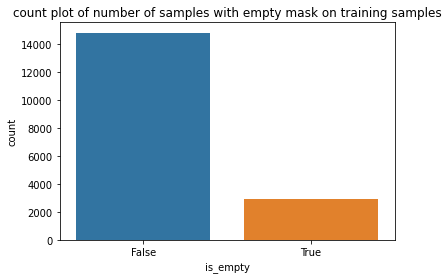

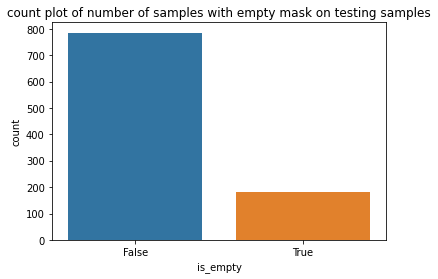

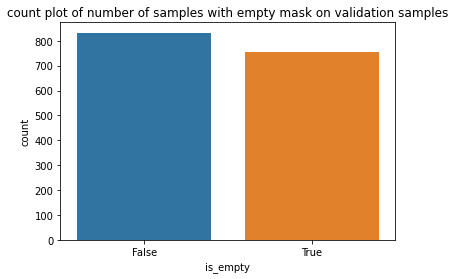

In [ ]:
sns.countplot(x ='is_empty', data = train_data_df)
plt.title('count plot of number of samples with empty mask on training samples')
plt.show()

sns.countplot(x ='is_empty', data = test_data_df)
plt.title('count plot of number of samples with empty mask on testing samples')
plt.show()

sns.countplot(x ='is_empty', data = eval_data_df)
plt.title('count plot of number of samples with empty mask on validation samples')
plt.show()

In [ ]:
del data_df, loaded_images
gc.collect()

6650

In [ ]:
class SegementationMetric(nn.Module):
    def __init__(self, w1=0.6, w2=0.4):
        """
        w1 corresponds to weightage of hausdorff distance
        w2 corresponds to weightage of dice coefficent score
        """

        assert w1 + w2 == 1, 'sum of all weights must be equal to 1'
        super(SegementationMetric, self).__init__()

        self.w1 = w1
        self.w2 = w2
        self.bce_loss = nn.BCELoss()

    
    def hausdorff_distance(self, pred, target):
        #pred shape: (N, C, H, W)
        #target shape: (N, C, H, W)
        pred = pred.detach().cpu().round()
        target = target.cpu()

        max_dist = max(target.shape[2:])

        warnings.filterwarnings("ignore")

        #compute the hausdorff distance for each batch
        batch_distances = compute_hausdorff_distance(pred, target, distance_metric='euclidean', include_background=True)

        batch_distances[batch_distances == torch.inf] = max_dist
        batch_distances[batch_distances != batch_distances] = 0

        #get max distance for each batch and compute mean
        batch_distances = batch_distances.max(dim=1)
        dist = batch_distances[0].mean()
        dist = dist / max_dist
        return dist


    def dice_coeff(self, prediction, ground_truth, epsilon=1e-5):
        #input shape: N, C, H, W
        prediction = prediction.cpu().round()
        ground_truth = ground_truth.cpu()
        intersection = torch.sum(torch.abs(ground_truth * prediction), dim=(2, 3))
        denominator = ground_truth.sum(dim=(2, 3)) + prediction.sum(dim=(2, 3))
        dice_coeff = ((2 * intersection + epsilon) / (denominator + epsilon)).mean(dim=(0, 1))
        return dice_coeff.item()

      
    def metric_values(self, prediction, ground_truth):
        #input shape: N, C, H, W
        hausdorff_distance = self.hausdorff_distance(prediction, ground_truth)
        dice_coeff = self.dice_coeff(prediction, ground_truth)
        bce_loss = self.bce_loss(prediction, ground_truth)

        return hausdorff_distance, dice_coeff, bce_loss

    
    def forward(self, prediction, ground_truth):
        #input shape: N, C, H, W
        hausdorff_distance, dice_coeff, bce_loss = self.metric_values(prediction, ground_truth)
        hausdorff_distance = torch.tensor(hausdorff_distance)

        acc_score = (self.w1 * (1 - hausdorff_distance)) + (self.w2 * dice_coeff)
        loss = (1 + bce_loss) * (1 - acc_score).requires_grad_(True)
        return loss
    

In [ ]:
input_channels = 1 
last_fmap_channel = 512
output_channel = 1 
n_classes=3
enc_dropout=0.0
dec_dropout=0.0


model = SegmentNet(
    input_channels, 
    last_fmap_channel, 
    output_channel, 
    n_classes, 
    enc_dropout=enc_dropout,
    dec_dropout=dec_dropout)


learning_rate = 1e-3
weight_decay = 0.0
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)

lossfunc = SegementationMetric(w1=0.5, w2=0.5)

In [ ]:
model

SegmentNet(
  (encoder): SpatialEncoder(
    (conv1): Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64,

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

pipeline = FitterPipeline(model, lossfunc, optimizer, device)

lr_scheduler = torch.optim.lr_scheduler.StepLR(
    pipeline.optimizer, step_size=28, gamma=0.1, verbose=True)

Adjusting learning rate of group 0 to 1.0000e-03.


In [ ]:
print(f'Model is training on {torch.cuda.get_device_name()} \n\n')

EPOCHS = 60

training_losses, training_hds, training_dice_coeffs = [], [], []
testing_losses, testing_hds, testing_dice_coeffs = [], [], []

w1, w2 = 0.6, 0.4

best_loss = np.inf
for i in range(EPOCHS):
    print(f'\n\nepoch: {i}')
    train_loss, training_hd, train_dice_coeff = pipeline.train(train_dataloader)
    training_losses.append(train_loss[0])
    training_hds.append(training_hd[0])
    training_dice_coeffs.append(train_dice_coeff[0])
    print(
        f'\ntraining loss: {train_loss[0]}',
        f'\ntraining hausdorff dist: {training_hd[0]}',
        f'\ntraining dice coeff: {train_dice_coeff[0]}', 
        f'\ntrain score: {(w1 * (1 - training_hd[0])) + (w2 * train_dice_coeff[0])}')
    
    test_loss, testing_hd, test_dice_coeff = pipeline.test(test_dataloader)
    testing_losses.append(test_loss)
    testing_hds.append(testing_hd)
    testing_dice_coeffs.append(test_dice_coeff)
    print(f'testing loss: {test_loss}', 
          f'\ntesting hausdorff dist: {testing_hd}', 
          f'\ntesting dice coeff: {test_dice_coeff}',
          f'\ntest score: {(w1 * (1 - testing_hd)) + (w2 * test_dice_coeff)}')
    
    lr_scheduler.step()
    if test_loss < best_loss:
        best_loss = test_loss
        pipeline.save_model()
        print(f'model saved at epoch {i}')

Model is training on Tesla P100-PCIE-16GB 




epoch: 0


555it [09:48,  1.06s/it]



training loss: 0.7470367789892992 
training hausdorff dist: 0.8263503537969791 
training dice coeff: 0.4262076007894467 
train score: 0.27467282803759124


31it [00:18,  1.69it/s]


testing loss: 0.7099212021414079 
testing hausdorff dist: 0.7355871183685291 
testing dice coeff: 0.37842859664270956 
test score: 0.3100191676359664
Adjusting learning rate of group 0 to 1.0000e-03.
model saved at epoch 0


epoch: 1


555it [09:41,  1.05s/it]


training loss: 0.6542144651984511 
training hausdorff dist: 0.7167397592766971 
training dice coeff: 0.4651593498818509 
train score: 0.35601988438672216



31it [00:17,  1.74it/s]


testing loss: 0.6197586485049512 
testing hausdorff dist: 0.7016488616272982 
testing dice coeff: 0.5061290869789739 
test score: 0.3814623178152106
Adjusting learning rate of group 0 to 1.0000e-03.
model saved at epoch 1


epoch: 2


555it [09:50,  1.06s/it]



training loss: 0.5689363938437597 
training hausdorff dist: 0.6005735472048712 
training dice coeff: 0.5053684934839472 
train score: 0.44180326907065615


31it [00:17,  1.75it/s]


testing loss: 0.5307594988303691 
testing hausdorff dist: 0.5683894052759871 
testing dice coeff: 0.5386344415526236 
test score: 0.4744201334554572
Adjusting learning rate of group 0 to 1.0000e-03.
model saved at epoch 2


epoch: 3


555it [09:54,  1.07s/it]



training loss: 0.5106169510712077 
training hausdorff dist: 0.5362064293793093 
training dice coeff: 0.548561016987036 
train score: 0.49770054916722883


31it [00:18,  1.64it/s]


testing loss: 0.49033462629631713 
testing hausdorff dist: 0.5281509170744856 
testing dice coeff: 0.5792458115085479 
test score: 0.5148077743587278
Adjusting learning rate of group 0 to 1.0000e-03.
model saved at epoch 3


epoch: 4


555it [09:59,  1.08s/it]



training loss: 0.4700635477833741 
training hausdorff dist: 0.4926574111488561 
training dice coeff: 0.5810576446958491 
train score: 0.536828611189026


31it [00:17,  1.74it/s]

testing loss: 0.5307220407368212 
testing hausdorff dist: 0.5775611394442416 
testing dice coeff: 0.5528167111258353 
test score: 0.47459000078378916
Adjusting learning rate of group 0 to 1.0000e-03.


epoch: 5



555it [09:58,  1.08s/it]


training loss: 0.4397136500022622 
training hausdorff dist: 0.46221144238656103 
training dice coeff: 0.6074071034117862 
train score: 0.5656359759327778



31it [00:18,  1.70it/s]


testing loss: 0.3956025741144506 
testing hausdorff dist: 0.4087132671966382 
testing dice coeff: 0.6345210229196856 
test score: 0.6085804488498913
Adjusting learning rate of group 0 to 1.0000e-03.
model saved at epoch 5


epoch: 6


555it [09:58,  1.08s/it]



training loss: 0.4159029234147385 
training hausdorff dist: 0.4397964599078517 
training dice coeff: 0.6300320384201703 
train score: 0.5881349394233572


31it [00:18,  1.70it/s]


testing loss: 0.3549865883051383 
testing hausdorff dist: 0.36868496552555846 
testing dice coeff: 0.6733633568209987 
test score: 0.6481343634130645
Adjusting learning rate of group 0 to 1.0000e-03.
model saved at epoch 6


epoch: 7


555it [10:00,  1.08s/it]



training loss: 0.39120006622923725 
training hausdorff dist: 0.4132416728428277 
training dice coeff: 0.6506494142987707 
train score: 0.6123147620138116


31it [00:18,  1.67it/s]


testing loss: 0.3467819321628916 
testing hausdorff dist: 0.36787354013539186 
testing dice coeff: 0.6884268003125344 
test score: 0.6546465960437786
Adjusting learning rate of group 0 to 1.0000e-03.
model saved at epoch 7


epoch: 8


555it [09:59,  1.08s/it]



training loss: 0.3778973464471897 
training hausdorff dist: 0.40222448568808244 
training dice coeff: 0.664639184120539 
train score: 0.6245209822353661


31it [00:18,  1.70it/s]


testing loss: 0.3299810118930494 
testing hausdorff dist: 0.3395967599944776 
testing dice coeff: 0.6913550803738255 
test score: 0.6727839761528436
Adjusting learning rate of group 0 to 1.0000e-03.
model saved at epoch 8


epoch: 9


555it [09:59,  1.08s/it]



training loss: 0.3664828417940476 
training hausdorff dist: 0.3926487285617632 
training dice coeff: 0.6767670185716302 
train score: 0.6351175702915941


31it [00:18,  1.68it/s]


testing loss: 0.298623084489348 
testing hausdorff dist: 0.3183919758069198 
testing dice coeff: 0.7321034073829651 
test score: 0.7018061774690341
Adjusting learning rate of group 0 to 1.0000e-03.
model saved at epoch 9


epoch: 10


555it [09:57,  1.08s/it]


training loss: 0.3504207508171624 
training hausdorff dist: 0.3757708952897525 
training dice coeff: 0.6906163343438158 
train score: 0.6507839965636748



31it [00:18,  1.71it/s]


testing loss: 0.4244313633503689 
testing hausdorff dist: 0.4690794963776141 
testing dice coeff: 0.6411594883088143 
test score: 0.5750160974969573
Adjusting learning rate of group 0 to 1.0000e-03.


epoch: 11


555it [09:57,  1.08s/it]



training loss: 0.3417446366379167 
training hausdorff dist: 0.36546600999459894 
training dice coeff: 0.6971868095097241 
train score: 0.6595951178071302


31it [00:18,  1.69it/s]


testing loss: 0.31568041183990514 
testing hausdorff dist: 0.33875374965035543 
testing dice coeff: 0.7192684123592992 
test score: 0.6844551151535064
Adjusting learning rate of group 0 to 1.0000e-03.


epoch: 12


555it [09:56,  1.07s/it]



training loss: 0.3291693113183622 
training hausdorff dist: 0.35211634934340597 
training dice coeff: 0.7079141228048651 
train score: 0.6718958395159025


31it [00:18,  1.63it/s]

testing loss: 0.4203158956770658 
testing hausdorff dist: 0.464202770663928 
testing dice coeff: 0.6466623660056822 
test score: 0.580143284003916
Adjusting learning rate of group 0 to 1.0000e-03.


epoch: 13



555it [09:56,  1.08s/it]



training loss: 0.3204675147971513 
training hausdorff dist: 0.3431212005659309 
training dice coeff: 0.7156439899324297 
train score: 0.6803848756334134


31it [00:18,  1.70it/s]

testing loss: 0.3118615645255214 
testing hausdorff dist: 0.3454387704262067 
testing dice coeff: 0.7324099002345916 
test score: 0.6857006978381126
Adjusting learning rate of group 0 to 1.0000e-03.


epoch: 14



555it [09:55,  1.07s/it]



training loss: 0.3147013721451761 
training hausdorff dist: 0.33743347399787765 
training dice coeff: 0.7209459302661655 
train score: 0.6859182877077397


31it [00:18,  1.70it/s]


testing loss: 0.24568580941814788 
testing hausdorff dist: 0.26317014529087757 
testing dice coeff: 0.7788914615108121 
test score: 0.7536544974297983
Adjusting learning rate of group 0 to 1.0000e-03.
model saved at epoch 14


epoch: 15


555it [09:53,  1.07s/it]



training loss: 0.30868319921075116 
training hausdorff dist: 0.33141840987064447 
training dice coeff: 0.7264463435422193 
train score: 0.691727491494501


31it [00:18,  1.71it/s]


testing loss: 0.24332940542295597 
testing hausdorff dist: 0.2604064183329135 
testing dice coeff: 0.7805169801558217 
test score: 0.7559629410625806
Adjusting learning rate of group 0 to 1.0000e-03.
model saved at epoch 15


epoch: 16


555it [09:53,  1.07s/it]



training loss: 0.30090759536829864 
training hausdorff dist: 0.32465930108126245 
training dice coeff: 0.7346228079752879 
train score: 0.6990535425413578


31it [00:18,  1.71it/s]

testing loss: 0.3101482039818647 
testing hausdorff dist: 0.3301574118569468 
testing dice coeff: 0.7204183263163413 
test score: 0.6900728834123684
Adjusting learning rate of group 0 to 1.0000e-03.


epoch: 17



555it [09:56,  1.07s/it]



training loss: 0.2938848945963314 
training hausdorff dist: 0.31586945062549593 
training dice coeff: 0.7394648999781221 
train score: 0.7062642896159512


31it [00:18,  1.71it/s]

testing loss: 0.2817361270933448 
testing hausdorff dist: 0.2926777838978096 
testing dice coeff: 0.7380302010043975 
test score: 0.7196054100630732
Adjusting learning rate of group 0 to 1.0000e-03.


epoch: 18



555it [09:55,  1.07s/it]



training loss: 0.29082565974838986 
training hausdorff dist: 0.3131758548974548 
training dice coeff: 0.7425924661997202 
train score: 0.7091314735414151


31it [00:18,  1.69it/s]

testing loss: 0.26722690690190276 
testing hausdorff dist: 0.2894347954651169 
testing dice coeff: 0.7632870462632948 
test score: 0.7316539412262478
Adjusting learning rate of group 0 to 1.0000e-03.


epoch: 19



555it [09:55,  1.07s/it]


training loss: 0.2865168327339756 
training hausdorff dist: 0.3094284198780532 
training dice coeff: 0.7471169553361497 
train score: 0.713189730207628



31it [00:18,  1.70it/s]

testing loss: 0.2883429009557307 
testing hausdorff dist: 0.3213833288091816 
testing dice coeff: 0.7535042282073728 
test score: 0.7085716939974401
Adjusting learning rate of group 0 to 1.0000e-03.


epoch: 20



555it [09:52,  1.07s/it]



training loss: 0.28464913766206673 
training hausdorff dist: 0.3076732284418319 
training dice coeff: 0.7488758479152714 
train score: 0.7149464021010093


31it [00:18,  1.70it/s]


testing loss: 0.23635633794163305 
testing hausdorff dist: 0.24580719806813162 
testing dice coeff: 0.7795560975228587 
test score: 0.7643381201682646
Adjusting learning rate of group 0 to 1.0000e-03.
model saved at epoch 20


epoch: 21


555it [09:57,  1.08s/it]



training loss: 0.2835523722264455 
training hausdorff dist: 0.3056793066191473 
training dice coeff: 0.749303210963 
train score: 0.7163137004137117


31it [00:18,  1.69it/s]


testing loss: 0.21563763346392265 
testing hausdorff dist: 0.22763171357655418 
testing dice coeff: 0.8019750310528663 
test score: 0.784210984275214
Adjusting learning rate of group 0 to 1.0000e-03.
model saved at epoch 21


epoch: 22


555it [09:56,  1.07s/it]



training loss: 0.27094482888647087 
training hausdorff dist: 0.29291848225990774 
training dice coeff: 0.7605102876285175 
train score: 0.7284530256954622


31it [00:18,  1.70it/s]


testing loss: 0.2284976730802385 
testing hausdorff dist: 0.24152968209383816 
testing dice coeff: 0.7903287180008427 
test score: 0.7712136779440342
Adjusting learning rate of group 0 to 1.0000e-03.


epoch: 23


555it [09:54,  1.07s/it]



training loss: 0.2631280894106545 
training hausdorff dist: 0.28366369411343106 
training dice coeff: 0.7664699453491348 
train score: 0.7363897616715953


31it [00:18,  1.72it/s]


testing loss: 0.18957745024620135 
testing hausdorff dist: 0.19627214107998353 
testing dice coeff: 0.8217396197780487 
test score: 0.8109325632632294
Adjusting learning rate of group 0 to 1.0000e-03.
model saved at epoch 23


epoch: 24


555it [09:49,  1.06s/it]


training loss: 0.26625679044500494 
training hausdorff dist: 0.2870079288885667 
training dice coeff: 0.7639254348772067 
train score: 0.7333654166177426



31it [00:18,  1.71it/s]

testing loss: 0.22121615352766275 
testing hausdorff dist: 0.23302056337061244 
testing dice coeff: 0.7964855182555414 
test score: 0.7787818692798492
Adjusting learning rate of group 0 to 1.0000e-03.


epoch: 25



555it [09:50,  1.06s/it]



training loss: 0.2611373222491446 
training hausdorff dist: 0.2819919647470498 
training dice coeff: 0.7687696488053949 
train score: 0.7383126806739281


31it [00:17,  1.72it/s]

testing loss: 0.21970021243984575 
testing hausdorff dist: 0.2249124817938622 
testing dice coeff: 0.7911819988681424 
test score: 0.7815253104709396
Adjusting learning rate of group 0 to 1.0000e-03.


epoch: 26



555it [09:48,  1.06s/it]



training loss: 0.25555234674867816 
training hausdorff dist: 0.2745773201968761 
training dice coeff: 0.7721910115834829 
train score: 0.7441300125152674


31it [00:18,  1.72it/s]

testing loss: 0.2202347438121691 
testing hausdorff dist: 0.23499106971506312 
testing dice coeff: 0.8004944516766456 
test score: 0.7792031388416203
Adjusting learning rate of group 0 to 1.0000e-03.


epoch: 27



555it [09:54,  1.07s/it]


training loss: 0.25959280140120594 
training hausdorff dist: 0.280569132475812 
training dice coeff: 0.7702541209555961 
train score: 0.7397601688967512



31it [00:18,  1.68it/s]


testing loss: 0.45442739827635686 
testing hausdorff dist: 0.5108343066367111 
testing dice coeff: 0.6289186025819471 
test score: 0.5450668570507522
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 28


555it [09:55,  1.07s/it]



training loss: 0.23555128716252746 
training hausdorff dist: 0.25573625300633857 
training dice coeff: 0.7918228979583259 
train score: 0.7632874073795273


31it [00:18,  1.69it/s]


testing loss: 0.17860573989685294 
testing hausdorff dist: 0.18967716644281407 
testing dice coeff: 0.8363937581739118 
test score: 0.8207512034038762
Adjusting learning rate of group 0 to 1.0000e-04.
model saved at epoch 28


epoch: 29


555it [09:55,  1.07s/it]



training loss: 0.22110005401483168 
training hausdorff dist: 0.23751698217529726 
training dice coeff: 0.801859085839074 
train score: 0.7782334450304512


31it [00:18,  1.69it/s]


testing loss: 0.17798109694235 
testing hausdorff dist: 0.1901240548927222 
testing dice coeff: 0.8379400603232845 
test score: 0.8211015911936804
Adjusting learning rate of group 0 to 1.0000e-04.
model saved at epoch 29


epoch: 30


555it [09:50,  1.06s/it]



training loss: 0.22059616298238502 
training hausdorff dist: 0.2383746725037471 
training dice coeff: 0.8036665292473527 
train score: 0.7784418081966928


31it [00:18,  1.71it/s]

testing loss: 0.17859271058519197 
testing hausdorff dist: 0.19079710851954823 
testing dice coeff: 0.8373168822257749 
test score: 0.820448487778581
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 31



555it [09:51,  1.07s/it]


training loss: 0.21607190713304136 
training hausdorff dist: 0.2331085195935501 
training dice coeff: 0.807229794790079 
train score: 0.7830268061599015



31it [00:18,  1.71it/s]


testing loss: 0.15725724962925788 
testing hausdorff dist: 0.1607284808519539 
testing dice coeff: 0.849390443294279 
test score: 0.8433190888065392
Adjusting learning rate of group 0 to 1.0000e-04.
model saved at epoch 31


epoch: 32


555it [09:50,  1.06s/it]



training loss: 0.2132817949631103 
training hausdorff dist: 0.22819245704082786 
training dice coeff: 0.8077446632557087 
train score: 0.7861823910777868


31it [00:18,  1.72it/s]

testing loss: 0.16081440122213 
testing hausdorff dist: 0.16910273043420676 
testing dice coeff: 0.8505196802077755 
test score: 0.8387462338225862
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 33



555it [09:52,  1.07s/it]



training loss: 0.21378142525596902 
training hausdorff dist: 0.23027314928837347 
training dice coeff: 0.8088393600137385 
train score: 0.7853718544324713


31it [00:18,  1.67it/s]

testing loss: 0.16942716523531423 
testing hausdorff dist: 0.17754693245957254 
testing dice coeff: 0.8422121828602206 
test score: 0.8303567136683447
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 34



555it [09:53,  1.07s/it]


training loss: 0.21131078956361277 
training hausdorff dist: 0.2270472582707641 
training dice coeff: 0.810397203763326 
train score: 0.787930526542872



31it [00:18,  1.69it/s]

testing loss: 0.18002401406699836 
testing hausdorff dist: 0.19125303006015948 
testing dice coeff: 0.8360578494687234 
test score: 0.8196713217513937
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 35



555it [09:54,  1.07s/it]



training loss: 0.2094291968127153 
training hausdorff dist: 0.2247058446262706 
training dice coeff: 0.8117373313989725 
train score: 0.7898714257838266


31it [00:18,  1.67it/s]

testing loss: 0.1662794269367818 
testing hausdorff dist: 0.17841450902088796 
testing dice coeff: 0.8490362148131093 
test score: 0.8325657805127109
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 36



555it [09:59,  1.08s/it]


training loss: 0.21033989452277738 
training hausdorff dist: 0.22512412375155136 
training dice coeff: 0.8104567187326448 
train score: 0.7891082132421272



31it [00:18,  1.67it/s]


testing loss: 0.16388862844547852 
testing hausdorff dist: 0.1703425934279252 
testing dice coeff: 0.8459003971469018 
test score: 0.8361546028020056
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 37


555it [09:59,  1.08s/it]



training loss: 0.20699396617770907 
training hausdorff dist: 0.221192429789509 
training dice coeff: 0.8129399658323408 
train score: 0.792460528459231


31it [00:18,  1.67it/s]

testing loss: 0.1682905617641299 
testing hausdorff dist: 0.18016091763055364 
testing dice coeff: 0.8469213631845289 
test score: 0.8306719946954795
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 38



555it [10:02,  1.09s/it]


training loss: 0.20702311569551146 
training hausdorff dist: 0.2225884315344588 
training dice coeff: 0.8142397993319743 
train score: 0.7921428608121144



31it [00:18,  1.65it/s]


testing loss: 0.15689357348064384 
testing hausdorff dist: 0.16193194524440327 
testing dice coeff: 0.8512429018174449 
test score: 0.843337993580336
Adjusting learning rate of group 0 to 1.0000e-04.
model saved at epoch 38


epoch: 39


555it [10:01,  1.08s/it]



training loss: 0.20759886439901473 
training hausdorff dist: 0.2233996857050867 
training dice coeff: 0.8139732437090831 
train score: 0.7915494860605812


31it [00:18,  1.69it/s]


testing loss: 0.16433011192122202 
testing hausdorff dist: 0.17278835087435412 
testing dice coeff: 0.8473955815838229 
test score: 0.8352852221089166
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 40


555it [09:55,  1.07s/it]



training loss: 0.20935747665881368 
training hausdorff dist: 0.22582639733902388 
training dice coeff: 0.812918601057551 
train score: 0.7896716020196061


31it [00:18,  1.70it/s]

testing loss: 0.1665492516624042 
testing hausdorff dist: 0.1765701387373252 
testing dice coeff: 0.8469275409175504 
test score: 0.832828933124625
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 41



555it [09:55,  1.07s/it]



training loss: 0.20657101532904565 
training hausdorff dist: 0.22168906827489185 
training dice coeff: 0.8142529875308544 
train score: 0.7926877540474067


31it [00:18,  1.70it/s]


testing loss: 0.1535871296111927 
testing hausdorff dist: 0.15812203504510566 
testing dice coeff: 0.8540942380505223 
test score: 0.8467644741931455
Adjusting learning rate of group 0 to 1.0000e-04.
model saved at epoch 41


epoch: 42


555it [09:51,  1.07s/it]



training loss: 0.20636617568082685 
training hausdorff dist: 0.22201236363870192 
training dice coeff: 0.8150311049040373 
train score: 0.7928050237783938


31it [00:18,  1.68it/s]


testing loss: 0.1618701725264839 
testing hausdorff dist: 0.17006051140068099 
testing dice coeff: 0.8495174050331116 
test score: 0.8377706551728361
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 43


555it [09:58,  1.08s/it]


training loss: 0.2030660733962252 
training hausdorff dist: 0.21834360546296064 
training dice coeff: 0.8177784068090421 
train score: 0.7961051994458405



31it [00:18,  1.68it/s]

testing loss: 0.15700958227426975 
testing hausdorff dist: 0.1634265129004649 
testing dice coeff: 0.8524711651186789 
test score: 0.8429325583071926
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 44



555it [09:58,  1.08s/it]



training loss: 0.2045777726578846 
training hausdorff dist: 0.21920335949301473 
training dice coeff: 0.8156870815131041 
train score: 0.7947528169094328


31it [00:18,  1.68it/s]

testing loss: 0.16562167125394314 
testing hausdorff dist: 0.17594185873939835 
testing dice coeff: 0.8478748279233133 
test score: 0.8335848159256862
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 45



555it [09:58,  1.08s/it]



training loss: 0.2006604205004581 
training hausdorff dist: 0.21525731307012083 
training dice coeff: 0.8193247376261531 
train score: 0.7985755072083887


31it [00:18,  1.69it/s]


testing loss: 0.15354259624743896 
testing hausdorff dist: 0.15952975887857312 
testing dice coeff: 0.855197996862473 
test score: 0.8463613434178454
Adjusting learning rate of group 0 to 1.0000e-04.
model saved at epoch 45


epoch: 46


555it [09:55,  1.07s/it]



training loss: 0.20256179900295912 
training hausdorff dist: 0.21729029115316692 
training dice coeff: 0.8177169819135923 
train score: 0.7967126180735368


31it [00:18,  1.70it/s]

testing loss: 0.15534740107058453 
testing hausdorff dist: 0.1657373296294391 
testing dice coeff: 0.8579092948667465 
test score: 0.8437213201690351
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 47



555it [09:52,  1.07s/it]


training loss: 0.2015580662488637 
training hausdorff dist: 0.21705136657639923 
training dice coeff: 0.8194603143511592 
train score: 0.7975533057946241



31it [00:18,  1.71it/s]


testing loss: 0.15122086618493377 
testing hausdorff dist: 0.15863154366509552 
testing dice coeff: 0.8590392528041717 
test score: 0.8484367749226114
Adjusting learning rate of group 0 to 1.0000e-04.
model saved at epoch 47


epoch: 48


555it [09:49,  1.06s/it]



training loss: 0.19848827652966528 
training hausdorff dist: 0.21258296650498212 
training dice coeff: 0.8210067693177644 
train score: 0.8008529278241165


31it [00:18,  1.70it/s]

testing loss: 0.15320233340869352 
testing hausdorff dist: 0.15775203429649937 
testing dice coeff: 0.8545322206712538 
test score: 0.847161667690602
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 49



555it [09:50,  1.06s/it]



training loss: 0.20111199124081172 
training hausdorff dist: 0.21701894218109077 
training dice coeff: 0.8202142328829378 
train score: 0.7978743278445206


31it [00:18,  1.71it/s]

testing loss: 0.15643144171374526 
testing hausdorff dist: 0.1669339516195223 
testing dice coeff: 0.856958681537259 
test score: 0.8426231016431902
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 50



555it [09:49,  1.06s/it]


training loss: 0.19724899607886845 
training hausdorff dist: 0.2115270046928338 
training dice coeff: 0.8222985413697389 
train score: 0.8020032137321953



31it [00:18,  1.72it/s]

testing loss: 0.15822851179523295 
testing hausdorff dist: 0.16492903079680193 
testing dice coeff: 0.8516448909236539 
test score: 0.8417005378913804
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 51



555it [09:48,  1.06s/it]


training loss: 0.19938261536241034 
training hausdorff dist: 0.21473384585803618 
training dice coeff: 0.8212622871270051 
train score: 0.7996646073359803



31it [00:17,  1.73it/s]

testing loss: 0.15461347351458157 
testing hausdorff dist: 0.15787304569313962 
testing dice coeff: 0.8516613071964633 
test score: 0.8459406954627016
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 52



555it [09:50,  1.06s/it]


training loss: 0.1994376010381008 
training hausdorff dist: 0.21418060276278367 
training dice coeff: 0.8207138891692634 
train score: 0.7997771940100351



31it [00:18,  1.71it/s]

testing loss: 0.1515260354106085 
testing hausdorff dist: 0.16075501623768093 
testing dice coeff: 0.8604849153949369 
test score: 0.8477409564153662
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 53



555it [09:51,  1.07s/it]


training loss: 0.19631715625379317 
training hausdorff dist: 0.21101648994708255 
training dice coeff: 0.8236258578730059 
train score: 0.8028404491809529



31it [00:18,  1.71it/s]

testing loss: 0.15169451211096077 
testing hausdorff dist: 0.15800217707040665 
testing dice coeff: 0.8573122485991447 
test score: 0.8481235931974138
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 54



555it [09:52,  1.07s/it]



training loss: 0.1998868225504097 
training hausdorff dist: 0.21555186792087078 
training dice coeff: 0.8211242782103049 
train score: 0.7991185905315995


31it [00:18,  1.70it/s]

testing loss: 0.1535701275399999 
testing hausdorff dist: 0.15934161941826772 
testing dice coeff: 0.8550936733522723 
test score: 0.8464324976899483
Adjusting learning rate of group 0 to 1.0000e-04.


epoch: 55



555it [09:54,  1.07s/it]



training loss: 0.19702464240040304 
training hausdorff dist: 0.21165019131280127 
training dice coeff: 0.8228681135821987 
train score: 0.8021571306451987


31it [00:18,  1.71it/s]

testing loss: 0.15354298787819484 
testing hausdorff dist: 0.16139502966483502 
testing dice coeff: 0.85720548898943 
test score: 0.846045177796871
Adjusting learning rate of group 0 to 1.0000e-05.


epoch: 56



555it [09:52,  1.07s/it]



training loss: 0.19494541754727124 
training hausdorff dist: 0.20997777583234115 
training dice coeff: 0.8252295548851426 
train score: 0.8041051564546524


31it [00:18,  1.72it/s]


testing loss: 0.14525907726494047 
testing hausdorff dist: 0.14906003629300035 
testing dice coeff: 0.861152796976028 
test score: 0.8550250970146109
Adjusting learning rate of group 0 to 1.0000e-05.
model saved at epoch 56


epoch: 57


555it [10:01,  1.08s/it]


training loss: 0.19151326344773478 
training hausdorff dist: 0.20504630170341262 
training dice coeff: 0.8269904514690777 
train score: 0.8077683995655836



31it [00:18,  1.66it/s]


testing loss: 0.1502903263818647 
testing hausdorff dist: 0.1599131162261823 
testing dice coeff: 0.8620794934611167 
test score: 0.8488839276487373
Adjusting learning rate of group 0 to 1.0000e-05.


epoch: 58


555it [10:03,  1.09s/it]



training loss: 0.19058122652914558 
training hausdorff dist: 0.20448542480058285 
training dice coeff: 0.8282848857544564 
train score: 0.8086226994214328


31it [00:18,  1.70it/s]


testing loss: 0.1544610804225514 
testing hausdorff dist: 0.16329819428348355 
testing dice coeff: 0.8572199921454152 
test score: 0.8449090802880759
Adjusting learning rate of group 0 to 1.0000e-05.


epoch: 59


555it [10:03,  1.09s/it]



training loss: 0.1912105708317858 
training hausdorff dist: 0.20446449314317183 
training dice coeff: 0.8270189145663837 
train score: 0.8081288699406504


31it [00:18,  1.66it/s]


testing loss: 0.14523465747402492 
testing hausdorff dist: 0.1504585819064113 
testing dice coeff: 0.8627098702615307 
test score: 0.8548087989607656
Adjusting learning rate of group 0 to 1.0000e-05.
model saved at epoch 59


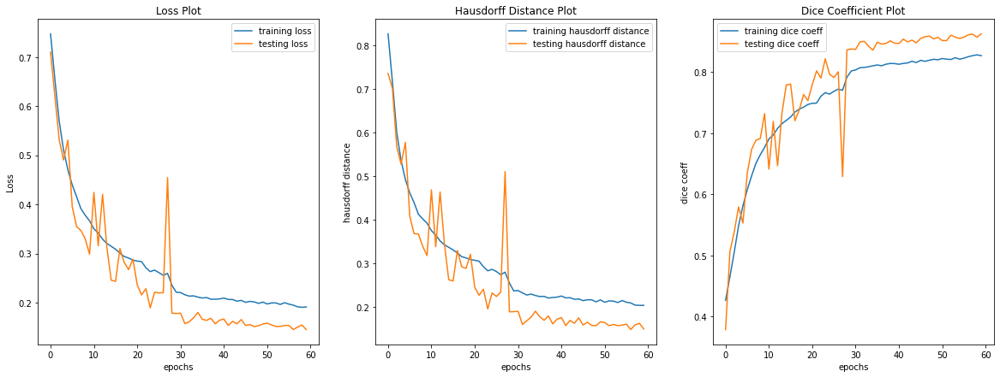

In [ ]:
fig, axs = plt.subplots(1, 3, figsize=(20, 7))

axs[0].plot(training_losses, label='training loss')
axs[0].plot(testing_losses, label='testing loss')
axs[0].set_xlabel('epochs')
axs[0].set_ylabel('Loss')
axs[0].set_title('Loss Plot')
axs[0].legend()

axs[1].plot(training_hds, label='training hausdorff distance')
axs[1].plot(testing_hds, label='testing hausdorff distance')
axs[1].set_xlabel('epochs')
axs[1].set_ylabel('hausdorff distance')
axs[1].set_title('Hausdorff Distance Plot')
axs[1].legend()

axs[2].plot(training_dice_coeffs, label='training dice coeff')
axs[2].plot(testing_dice_coeffs, label='testing dice coeff')
axs[2].set_xlabel('epochs')
axs[2].set_ylabel('dice coeff')
axs[2].set_title('Dice Coefficient Plot')
axs[2].legend()

In [ ]:
best_model_path = './model_params/tumor_segmentation_params.pth.tar' 
best_model_state = torch.load(best_model_path)['segmentation_net_params']

pipeline.model.load_state_dict(best_model_state)

eval_loss, eval_hd, eval_dice_coeff = pipeline.test(eval_dataloader, verbose=True)

50it [00:27,  1.84it/s]


 Testing Loss: 0.11386216771674276  
Test Dice Coeff: 0.897783066034317 
Test Hausdorff Distance: 0.12427857716019557


 final mean score is: 0.7933791921299942


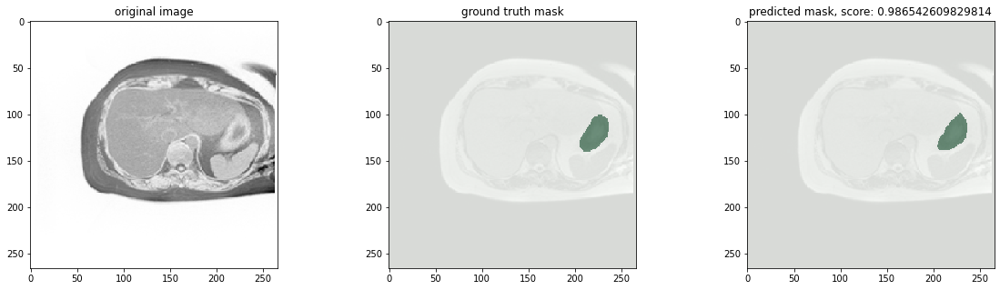

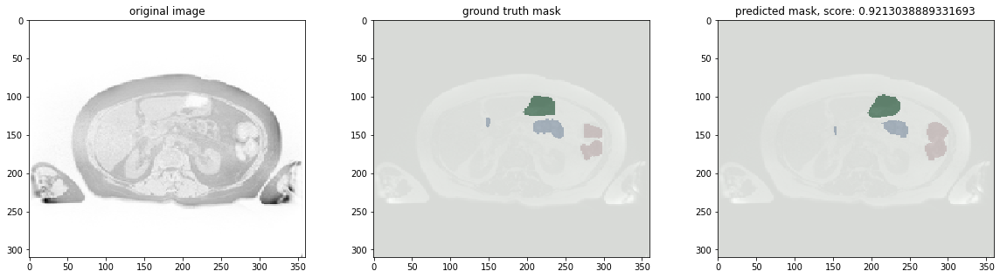

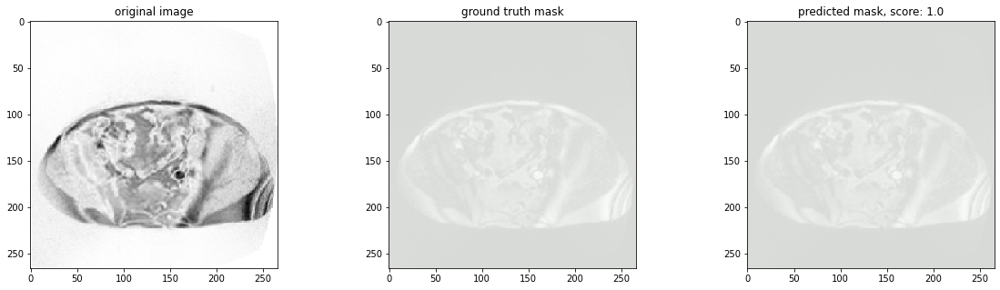

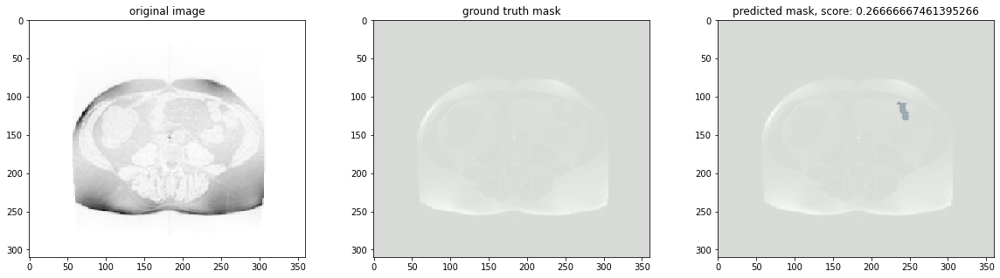

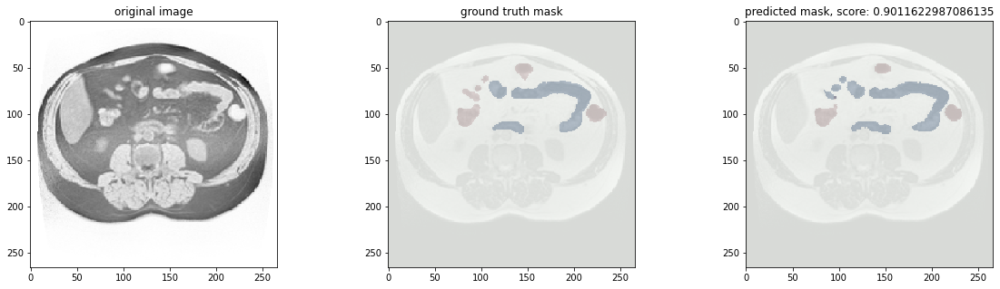

...

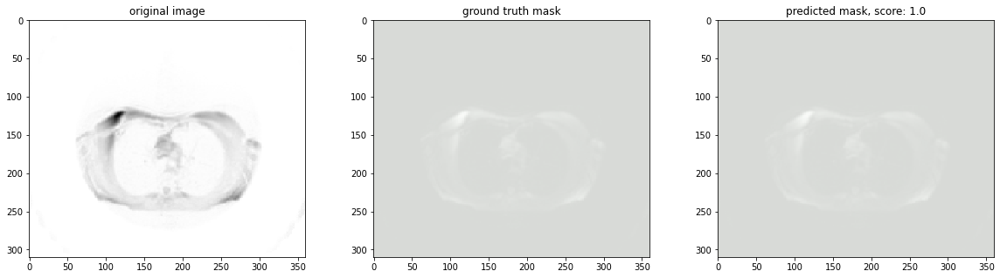

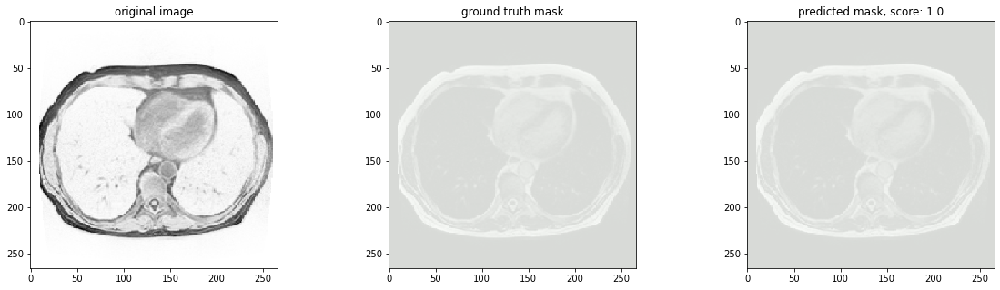

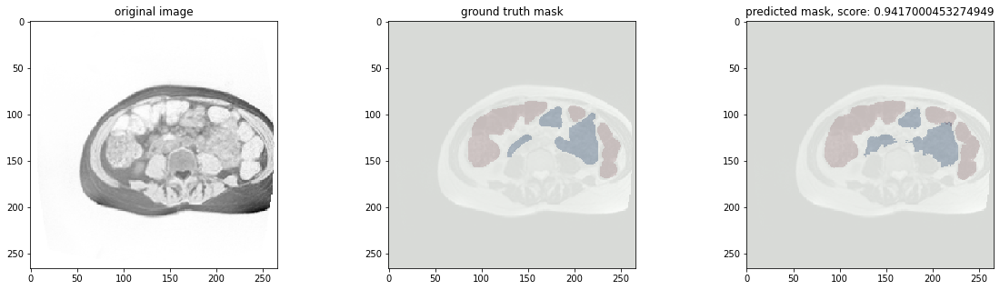

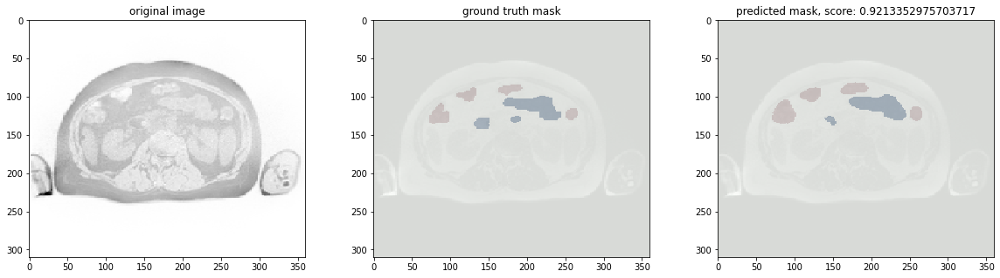

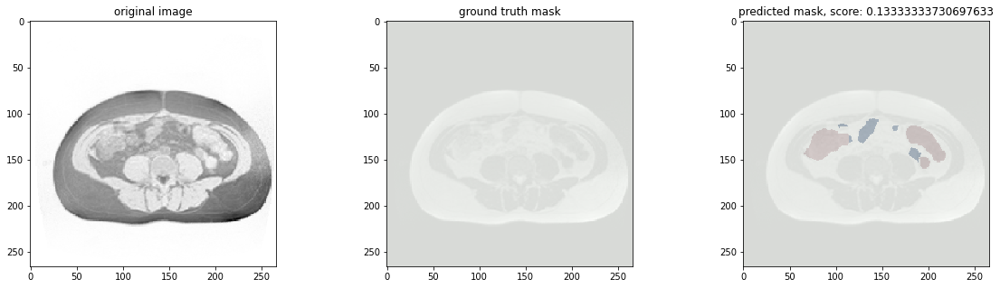

In [ ]:
rand_idx = np.random.randint(0, len(eval_data)-1, 100)

scores = []

for i in rand_idx:
    h, w = eval_data_df.height[i], eval_data_df.width[i]

    image, gt_mask = eval_data[i]

    gt_mask = gt_mask.unsqueeze(dim=0)

    eval_sample = image.unsqueeze(dim=0).to(device)
    pred_mask = pipeline.model(eval_sample)

    #resize tensors appropriately
    image = image_resize(image, (h, w))
    gt_mask = image_resize(gt_mask, (h, w))
    pred_mask = image_resize(pred_mask, (h, w))

    #print(pred_mask.shape, gt_mask.shape)
    dice_score = pipeline.lossfunc.dice_coeff(pred_mask, gt_mask)

    hd = pipeline.lossfunc.hausdorff_distance(pred_mask, gt_mask)

    pred_score = (0.6 * (1 - hd)) + (0.4 * dice_score)
    scores.append(pred_score)

    gt_mask = gt_mask.squeeze()
    pred_mask = pred_mask.squeeze().round().detach().cpu()

    lb_gt_mask, sb_gt_mask, stomach_gt_mask = gt_mask
    lb_pred_mask, sb_pred_mask, stomach_pred_mask = pred_mask

    alpha = 0.5

    fig, axs = plt.subplots(1, 3, figsize=(20, 5))
    axs[0].imshow(image.squeeze(), cmap='gray', interpolation='none')
    axs[0].set_title('original image')

    axs[1].imshow(image.squeeze(), cmap='Greys', interpolation='none')
    axs[1].imshow(lb_gt_mask, cmap='Reds', alpha=alpha, interpolation='none')
    axs[1].imshow(sb_gt_mask, cmap='Blues', alpha=alpha, interpolation='none')
    axs[1].imshow(stomach_gt_mask, cmap='Greens', alpha=alpha, interpolation='none')
    axs[1].set_title('ground truth mask')

    axs[2].imshow(image.squeeze(), cmap='Greys', interpolation='none')
    axs[2].imshow(lb_pred_mask, cmap='Reds', alpha=alpha, interpolation='none')
    axs[2].imshow(sb_pred_mask, cmap='Blues', alpha=alpha, interpolation='none')
    axs[2].imshow(stomach_pred_mask, cmap='Greens', alpha=alpha, interpolation='none')
    axs[2].set_title(f'predicted mask, score: {pred_score}')


scores = np.array(scores)
scores = scores[~(scores == 1)]
scores[scores < 0.4] = 0
print(f' final mean score is: {np.mean(scores)}')